In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


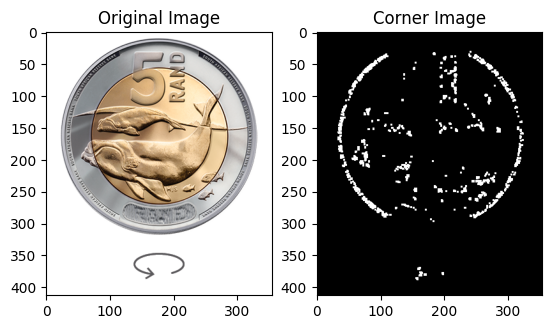

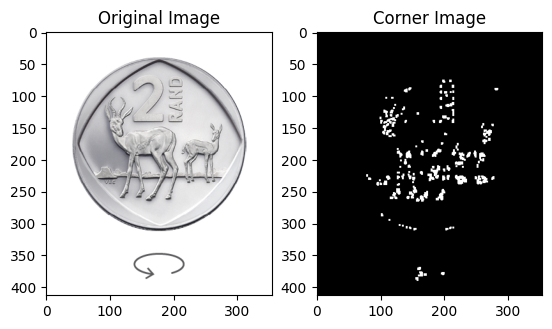

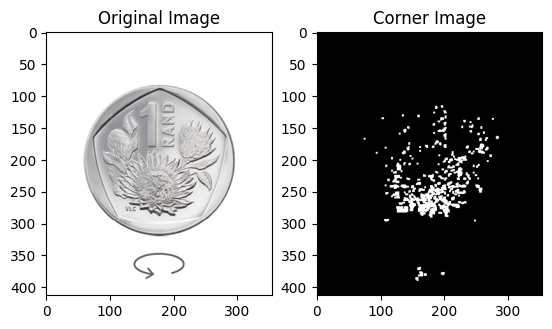

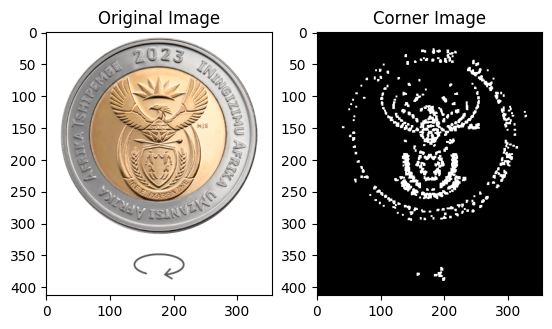

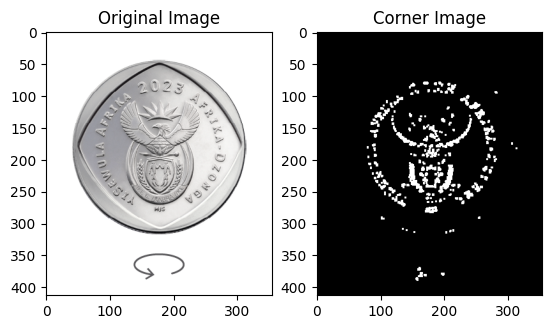

...

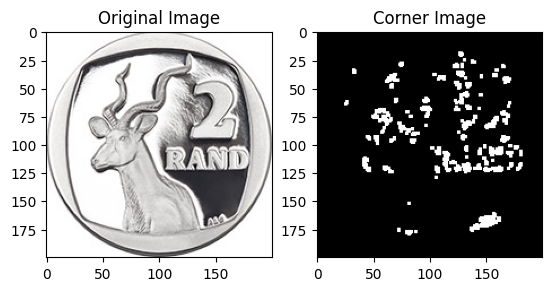

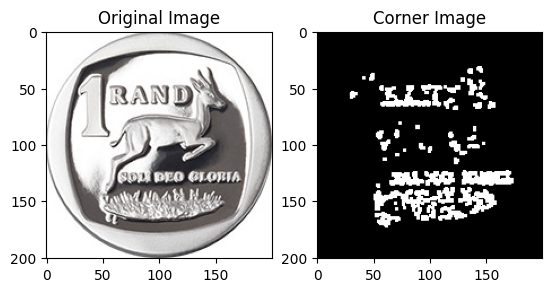

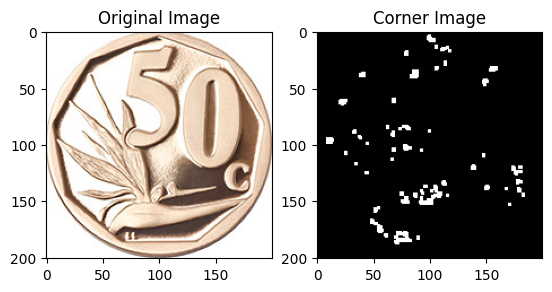

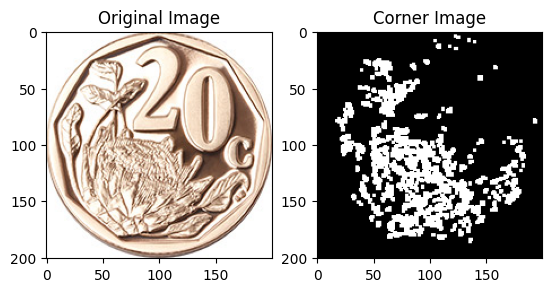

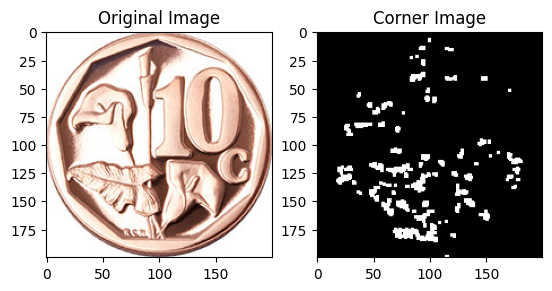

In [134]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Set the directory path where the images are located
image_dir = '/content/drive/MyDrive/Coins/Coins/'

def corner_image(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect corners using Harris corner detection
    # Adjust the parameters as needed
    dst = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)
    dst = cv2.dilate(dst, None)  # Optional: Dilate the corners to make them more visible

    # Threshold the corner response to identify strong corners
    threshold = 0.01 * dst.max()
    corner_image = np.zeros_like(gray)
    corner_image[dst > threshold] = 255
    return corner_image

# Iterate over the files in the image directory
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply corner detection
        corner_img = corner_image(image)

        # Display the original and corner-detected images
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.subplot(122)
        plt.imshow(corner_img, cmap='gray')
        plt.title('Corner Image')
        plt.show()


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import os

# Set the directory path where the images are located
image_dir = '/content/drive/MyDrive/Coins/Coins/'

def show_edges_and_gray(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply edge detection
    edges = cv2.Canny(gray, threshold1=50, threshold2=150)

    # Perform line detection using Hough Line Transform
    lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=100)

    # Draw the detected lines on the image
    if lines is not None:
        for line in lines:
            rho, theta = line[0]
            cos_theta = np.cos(theta)
            sin_theta = np.sin(theta)
            x0 = cos_theta * rho
            y0 = sin_theta * rho
            x1 = int(x0 + 1000 * (-sin_theta))
            y1 = int(y0 + 1000 * (cos_theta))
            x2 = int(x0 - 1000 * (-sin_theta))
            y2 = int(y0 - 1000 * (cos_theta))
            cv2.line(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    return edges, gray

# Iterate over the files in the image directory
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply show_edges_and_gray function
        edges, gray = show_edges_and_gray(image)

        # Display the original, edges, and grayscale images
        cv2_imshow(image)
        cv2_imshow(edges)
        cv2_imshow(gray)
        cv2.waitKey(0)


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import os

# Set the directory path where the images are located
image_dir = '/content/drive/MyDrive/Coins/Coins/'

def sobel_normalized(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Sobel edge detection
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    edges = cv2.sqrt(cv2.addWeighted(cv2.pow(sobel_x, 2.0), 1.0, cv2.pow(sobel_y, 2.0), 1.0, 0))

    # Normalize the edges
    edges = cv2.normalize(edges, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    return edges

# Iterate over the files in the image directory
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply sobel_normalized function
        edges = sobel_normalized(image)

        # Display the edges
        cv2_imshow(edges)


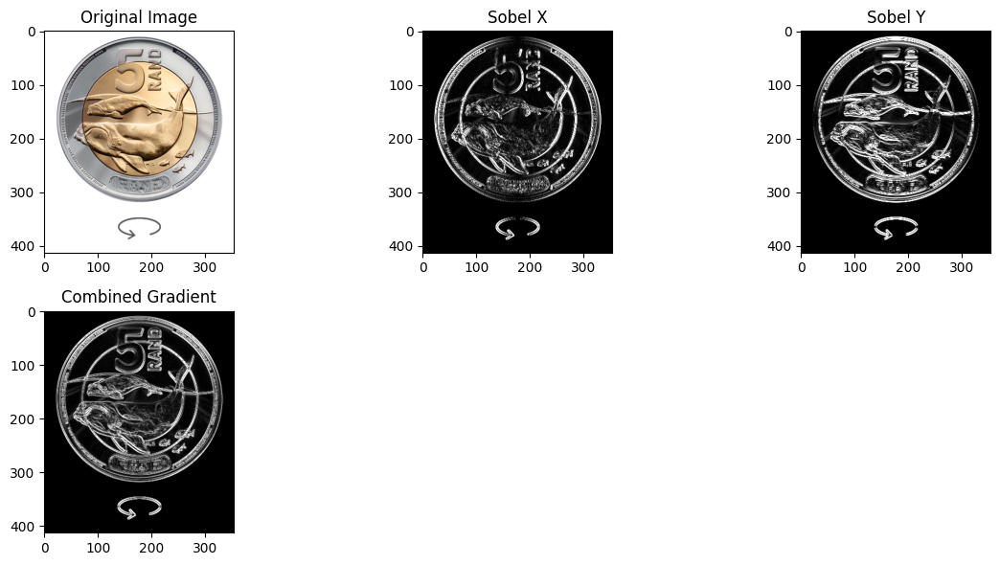

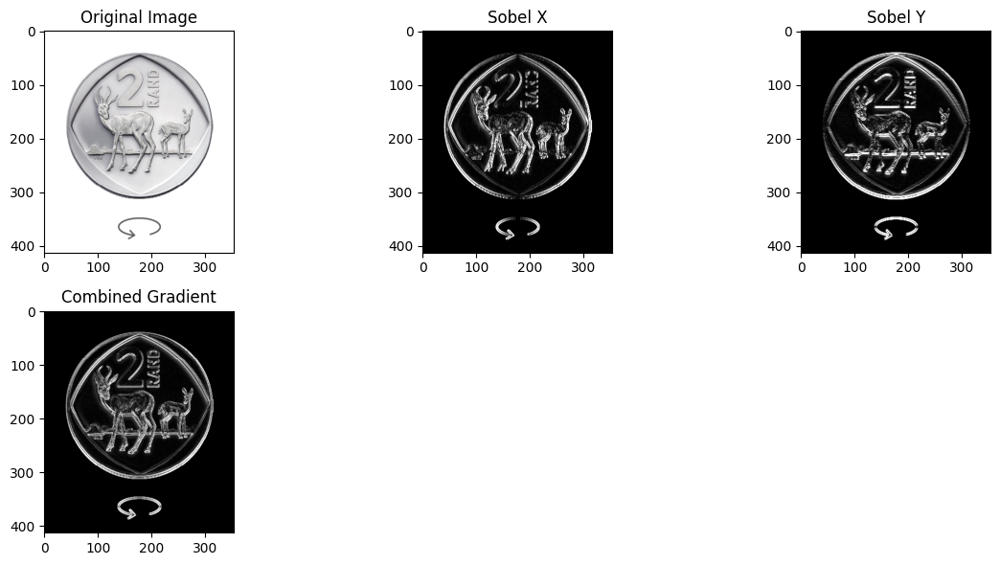

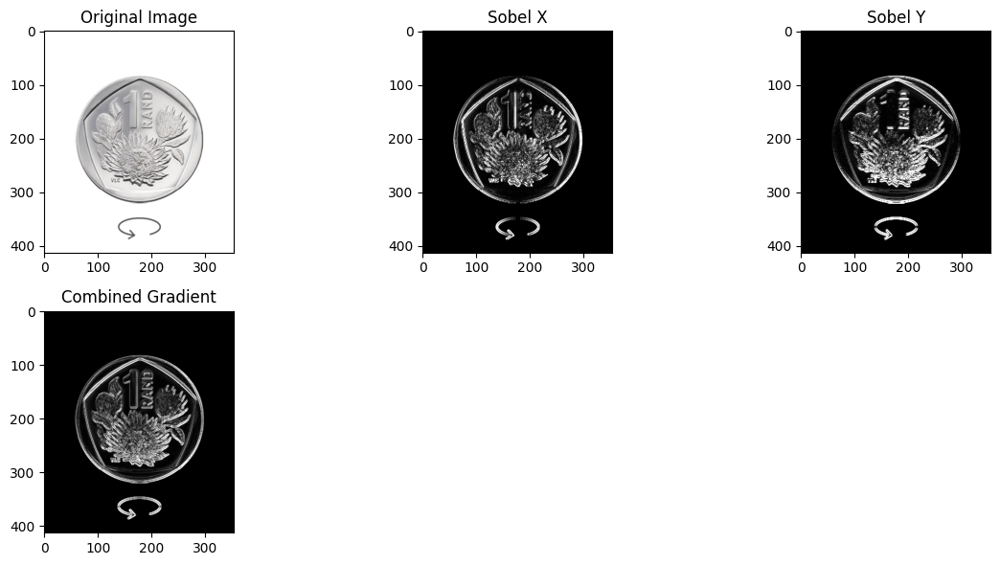

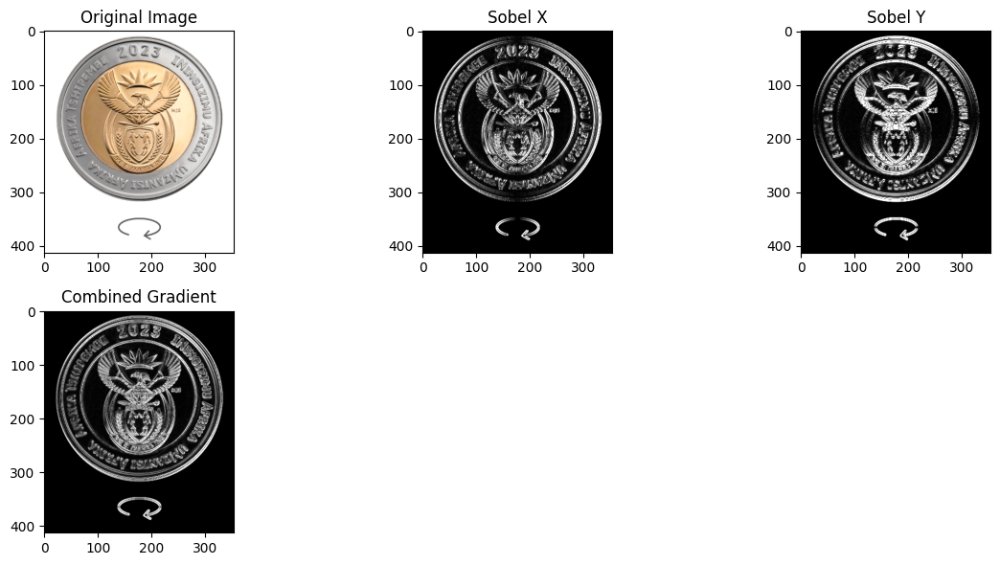

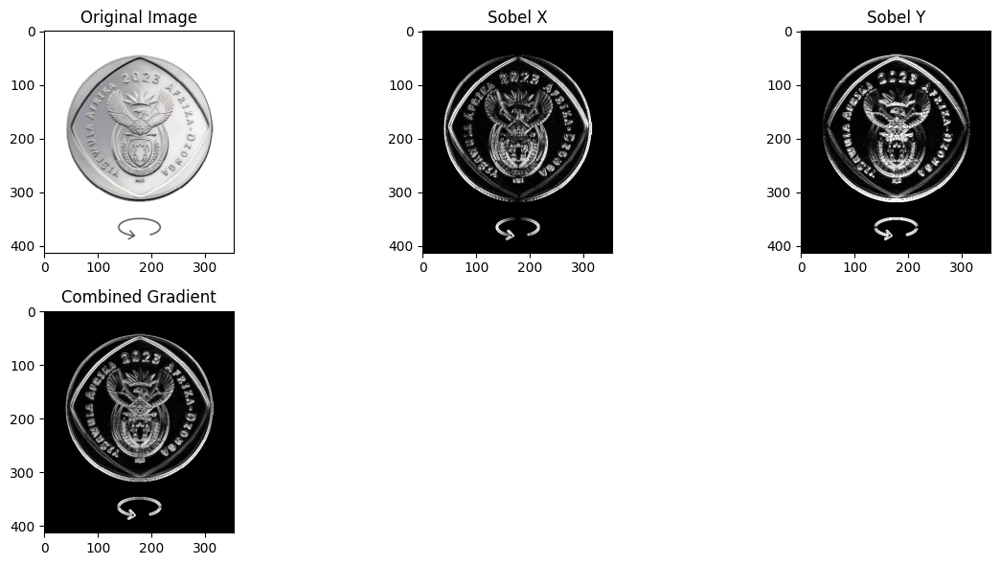

...

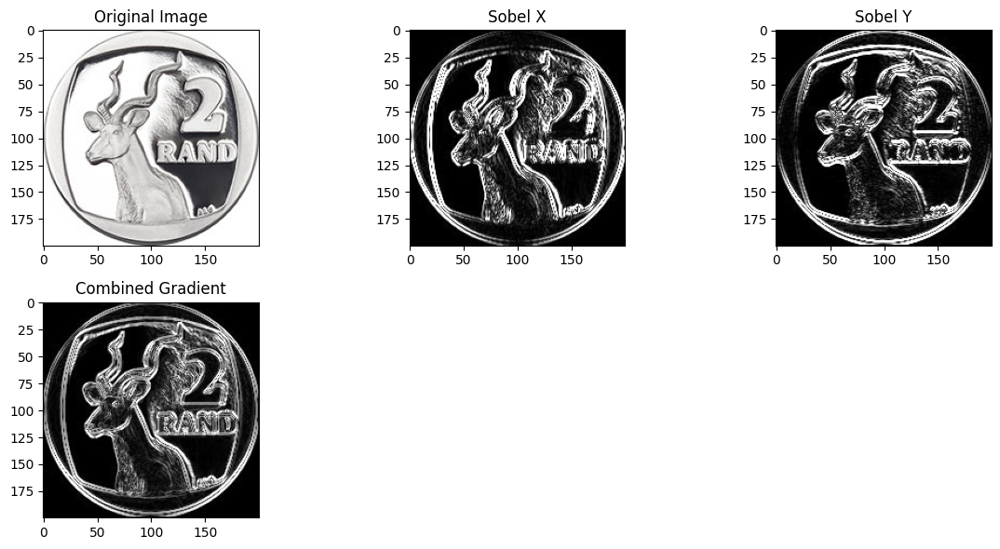

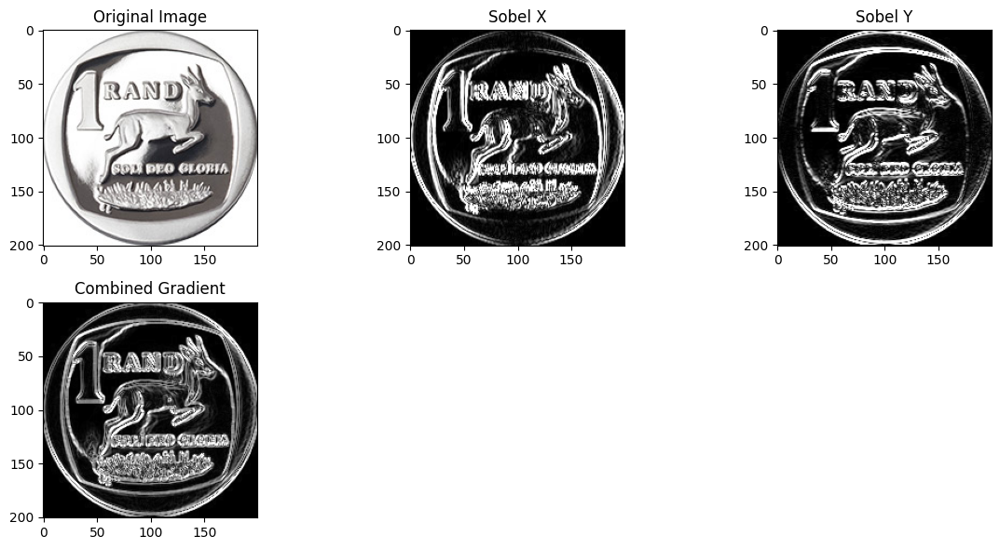

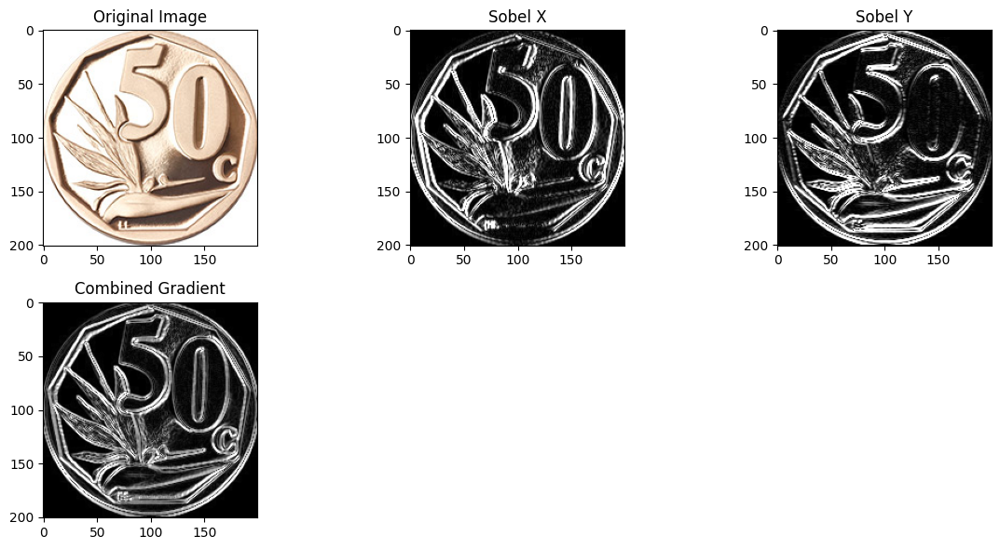

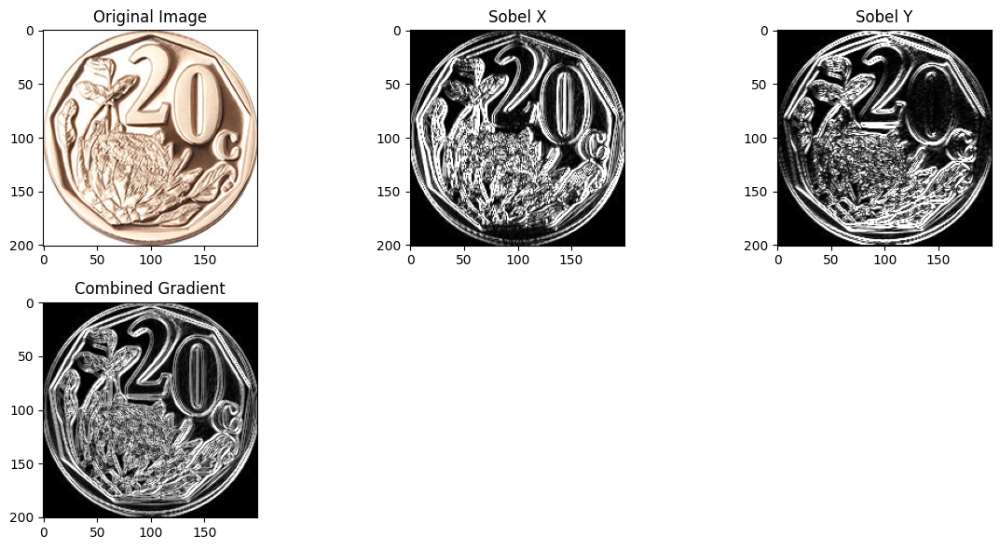

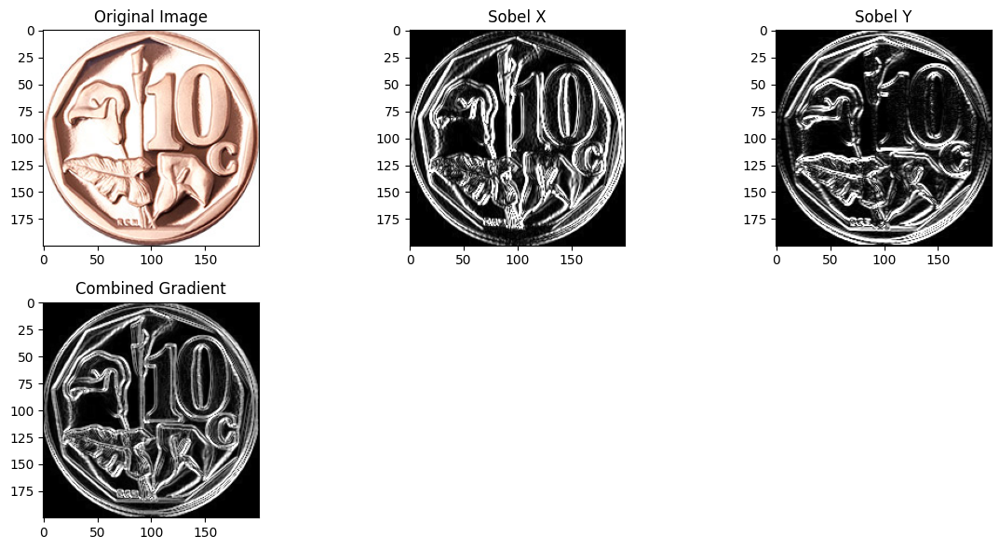

In [137]:
import cv2
import numpy as np
import os

# Set the directory path where the images are located
image_dir = '/content/drive/MyDrive/Coins/Coins/'

def combined_gradient(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Sobel operator for horizontal gradient
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    abs_sobel_x = cv2.convertScaleAbs(sobel_x)

    # Apply Sobel operator for vertical gradient
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    abs_sobel_y = cv2.convertScaleAbs(sobel_y)

    # Combine the gradient components
    combined = cv2.addWeighted(abs_sobel_x, 0.5, abs_sobel_y, 0.5, 0)
    return sobel_x, abs_sobel_x, sobel_y, abs_sobel_y, combined

# Iterate over the files in the image directory
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply combined_gradient function
        sobel_x, abs_sobel_x, sobel_y, abs_sobel_y, combined = combined_gradient(image)

        # Display the gradients and combined image
        plt.figure(figsize=(12, 6))
        plt.subplot(231)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.subplot(232)
        plt.imshow(abs_sobel_x, cmap='gray')
        plt.title('Sobel X')
        plt.subplot(233)
        plt.imshow(abs_sobel_y, cmap='gray')
        plt.title('Sobel Y')
        plt.subplot(234)
        plt.imshow(combined, cmap='gray')
        plt.title('Combined Gradient')
        plt.tight_layout()
        plt.show()


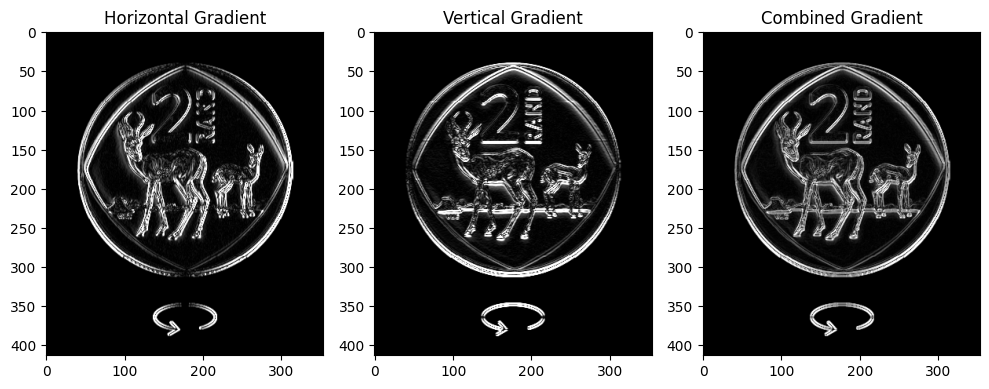

In [133]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
image_path = '/content/drive/MyDrive/Coins/Coins/R2_O1.png'
image = cv2.imread(image_path)
sobel_x, abs_sobel_x, sobel_y, abs_sobel_y, combined = combined_gradient(image)
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.imshow(abs_sobel_x, cmap='gray')
plt.title('Horizontal Gradient')

plt.subplot(1, 3, 2)
plt.imshow(abs_sobel_y, cmap='gray')
plt.title('Vertical Gradient')

plt.subplot(1, 3, 3)
plt.imshow(combined, cmap='gray')
plt.title('Combined Gradient')

plt.tight_layout()
plt.show()

In [143]:

# Apply Sobel edge detection
def seg_image(image):
  sobel_x, abs_sobel_x, sobel_y, abs_sobel_y, combined = combined_gradient(image)
  sobel_x = cv2.Sobel(combined, cv2.CV_64F, 1, 0, ksize=3)
  sobel_y = cv2.Sobel(combined, cv2.CV_64F, 0, 1, ksize=3)
  edges = cv2.sqrt(cv2.addWeighted(cv2.pow(sobel_x, 2.0), 1.0, cv2.pow(sobel_y, 2.0), 1.0, 0))

  # Normalize the edges
  edges = cv2.normalize(edges, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

  # Display the result
  cv2_imshow(edges)

  # Convert the image to binary using adaptive thresholding
  _, binary_image = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

  # Apply morphological operations to remove noise and enhance regions
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

  # Perform distance transform to obtain markers for watershed
  dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 3)
  _, markers = cv2.threshold(dist_transform, 0.1 * dist_transform.max(), 255, 0)
  markers = cv2.connectedComponents(markers.astype(np.uint8))[1]

  # Convert the grayscale image to 3-channel color image
  image_color = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

  # Apply watershed algorithm for segmentation
  segmented_image = cv2.watershed(image_color, markers)
  segmented_image[segmented_image == -1] = 0

  # Apply adaptive thresholding
  block_size = 25
  constant = 9
  binary_image = cv2.adaptiveThreshold(combined, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, block_size, constant)

  # Apply morphological operations to remove noise and enhance regions
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

  # Perform distance transform to obtain markers for watershed
  dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 3)
  _, markers = cv2.threshold(dist_transform, 0.1 * dist_transform.max(), 255, 0)
  markers = cv2.connectedComponents(markers.astype(np.uint8))[1]

  # Convert the grayscale image to 3-channel color image
  image_color = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

  # Apply watershed algorithm for segmentation
  segmented_image = cv2.watershed(image_color, markers)
  segmented_image[segmented_image == -1] = 0
  return segmented_image
  image_dir = '/content/drive/MyDrive/Coins/Coins/'
  for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply seg_image function
        segmented_image = seg_image(image)

        # Display the segmented image
        cv2_imshow(segmented_image)
        plt.title('Segmented image')
        plt.tight_layout()
        plt.show()



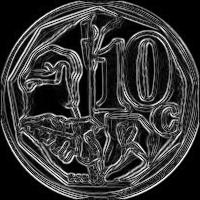

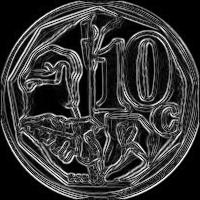

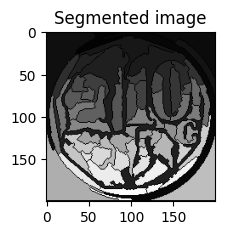

In [144]:
image_path = '/content/drive/MyDrive/Coins/Coins/10c.jpg'
image = cv2.imread(image_path)
seg_image(image)
plt.subplot(1, 3, 3)
plt.imshow(seg_image(image), cmap='gray')
plt.title('Segmented image')

plt.tight_layout()
plt.show()

In [54]:
def Adaptive_thresh(image):
  _, _, _, _, combined = combined_gradient(image)
  # Apply adaptive thresholding
  block_size = 25
  constant = 9
  binary_image = cv2.adaptiveThreshold(combined, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, block_size, constant)

  # Apply morphological operations to remove noise and enhance regions
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

  # Perform distance transform to obtain markers for watershed
  dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 3)
  _, markers = cv2.threshold(dist_transform, 0.1 * dist_transform.max(), 255, 0)
  markers = cv2.connectedComponents(markers.astype(np.uint8))[1]

  # Convert the grayscale image to 3-channel color image
  image_color = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

  # Apply watershed algorithm for segmentation
  segmented_image = cv2.watershed(image_color, markers)
  segmented_image[segmented_image == -1] = 0

  return segmented_image


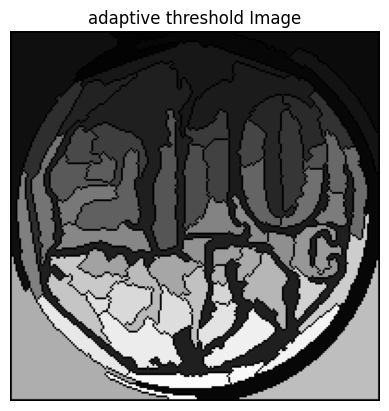

In [55]:
# adaptive threshold
plt.imshow(Adaptive_thresh(image), cmap='gray')
plt.title('adaptive threshold Image')
plt.axis('off')
plt.show()

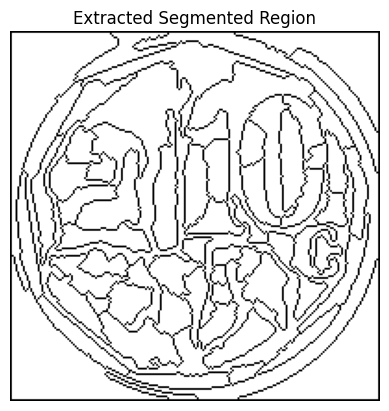

In [145]:
def extracted_segmentation_region(image):
  # Create a mask based on the segmented image
  segmented_image= Adaptive_thresh(image)
  segmented_mask = np.where(segmented_image != 0, 255, 0).astype(np.uint8)

  # Apply the mask to the original image
  segmented_region = cv2.bitwise_and(image, image, mask=segmented_mask)
  return segmented_image, segmented_mask
# Display the extracted segmented region
_, segmented_region =extracted_segmentation_region(image)
plt.imshow(segmented_region, cmap='gray')
plt.title('Extracted Segmented Region')
plt.axis('off')
plt.show()

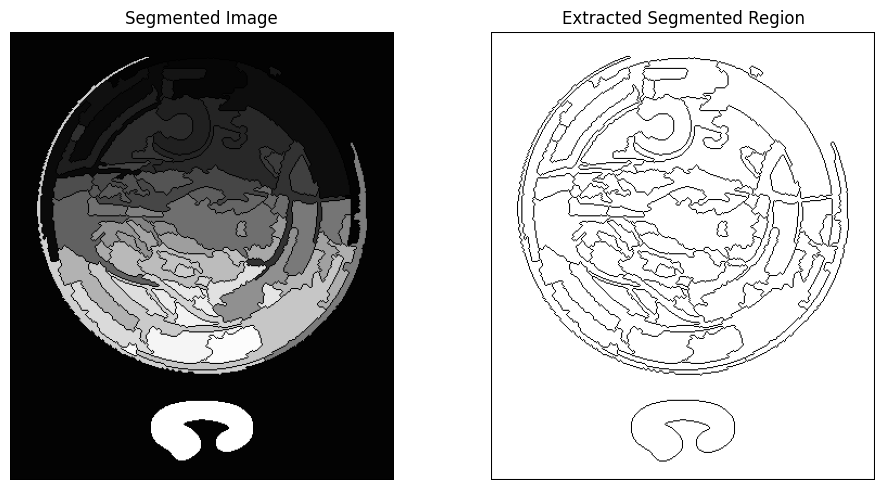

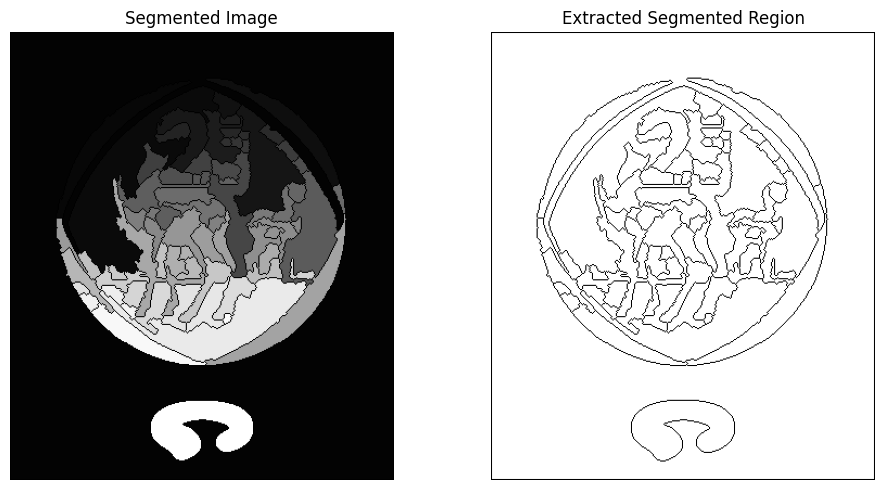

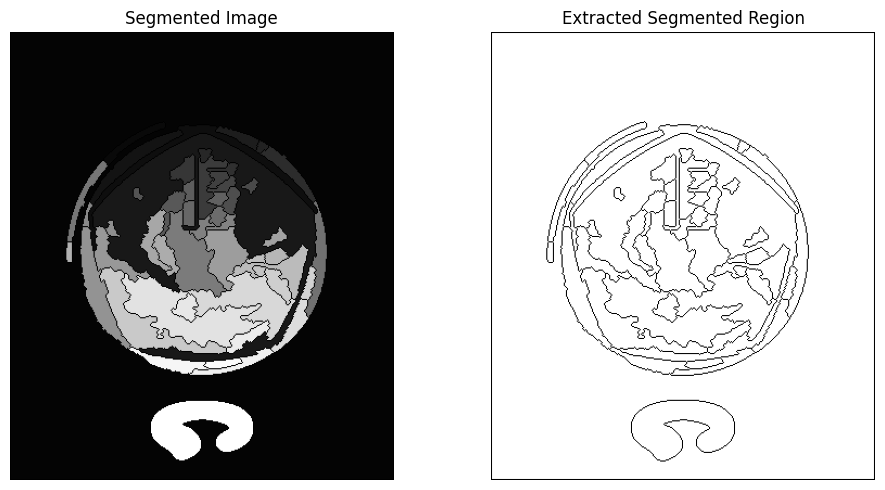

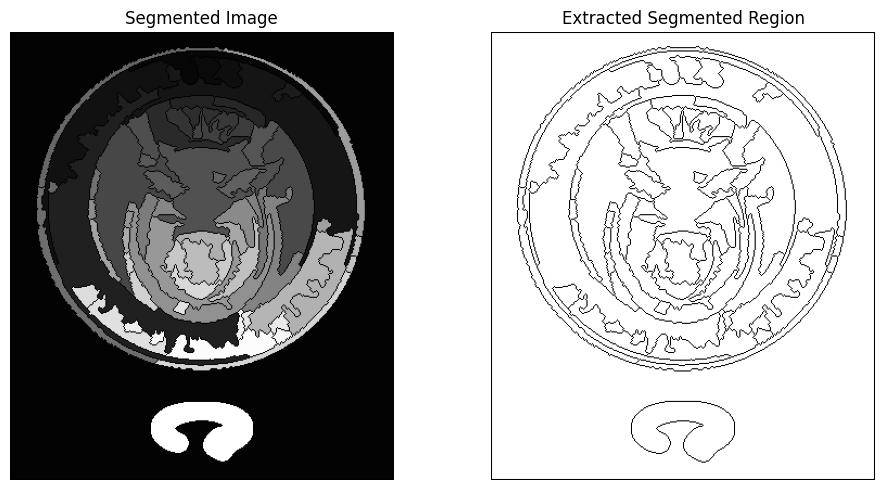

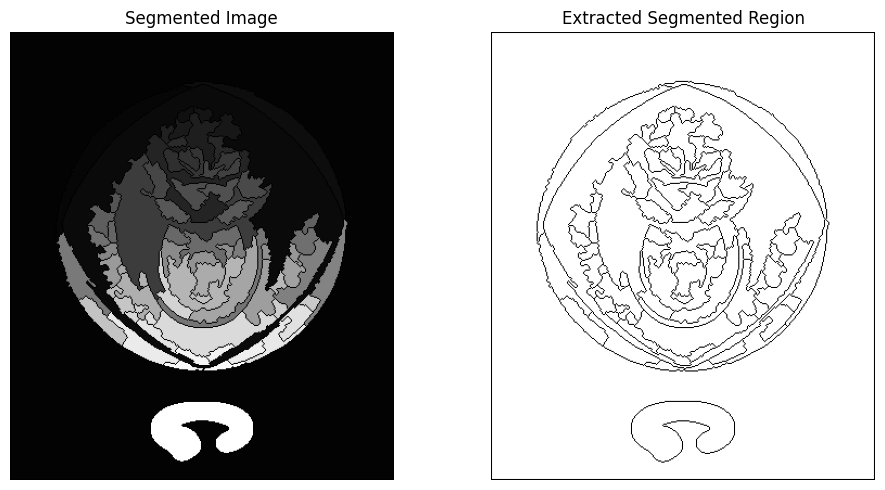

...

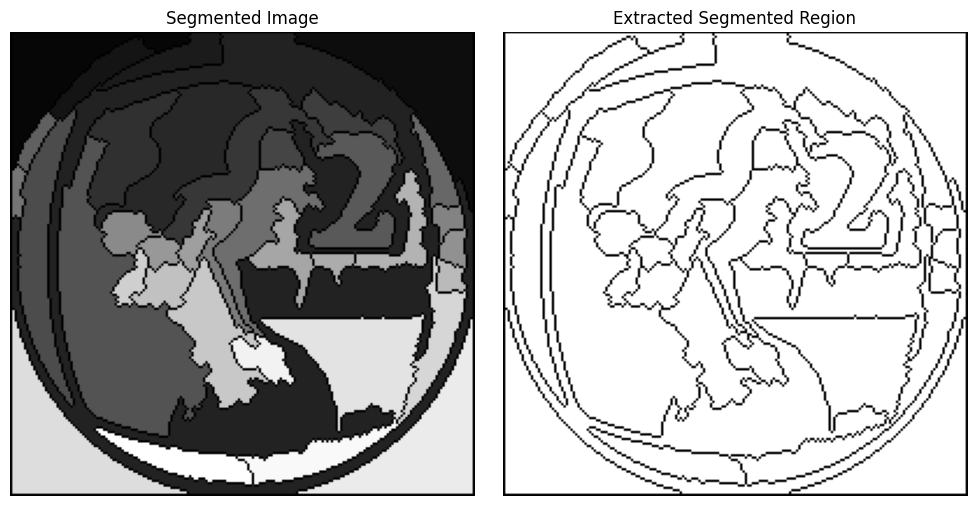

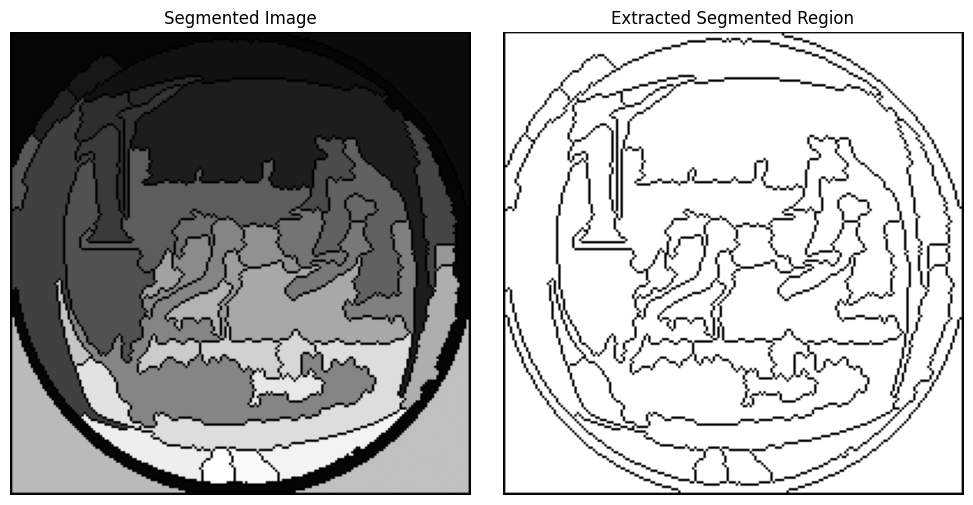

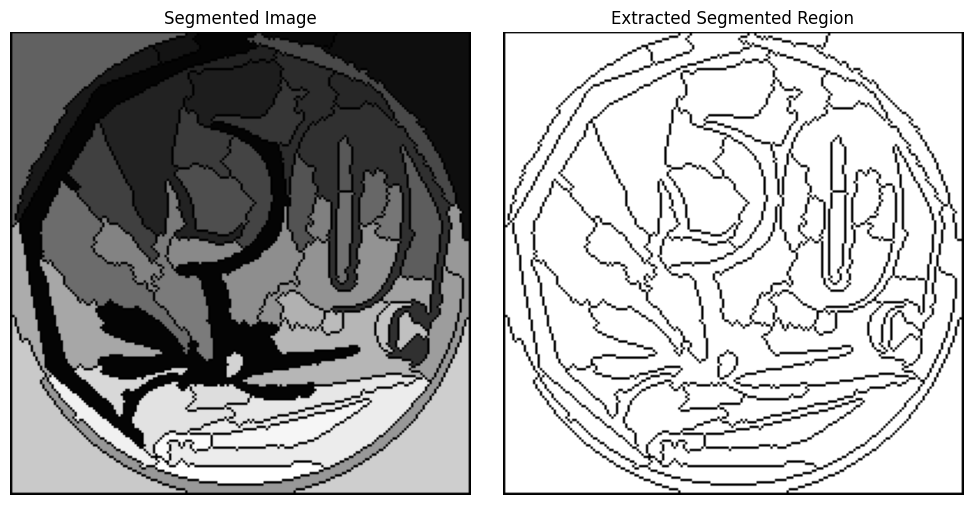

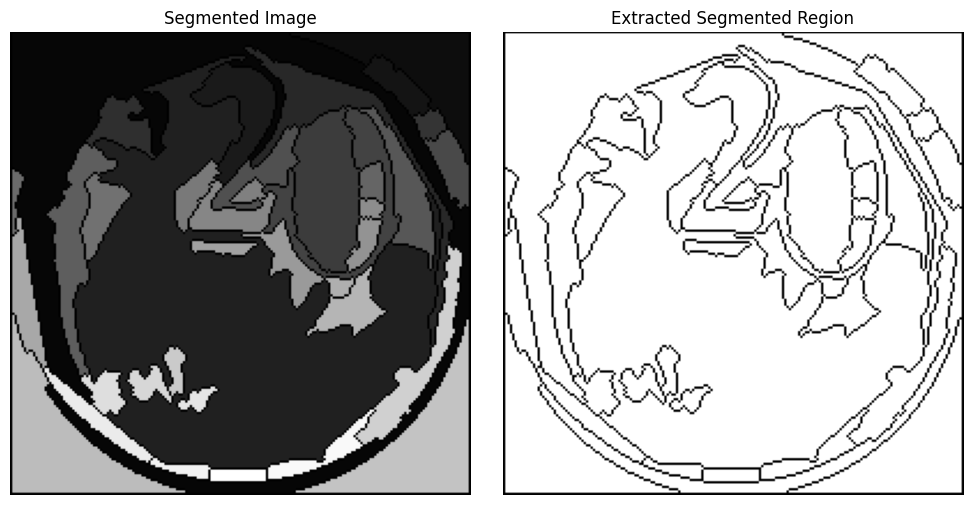

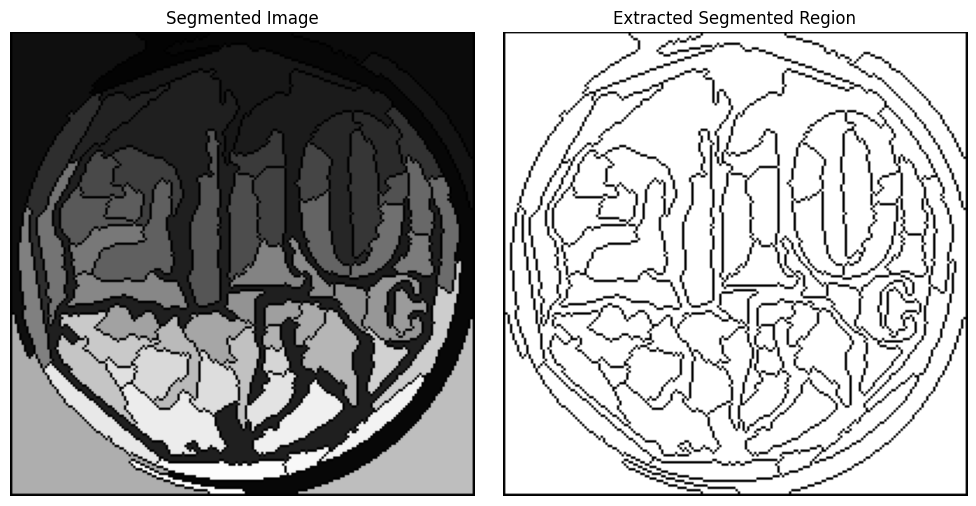

In [146]:
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply extracted_segmentation_region function
        segmented_image, segmented_mask = extracted_segmentation_region(image)

        # Create a figure to display the results
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        # Display the segmented image
        axs[0].imshow(segmented_image, cmap='gray')
        axs[0].set_title('Segmented Image')
        axs[0].axis('off')

        # Display the segmented region
        axs[1].imshow(segmented_mask, cmap='gray')
        axs[1].set_title('Extracted Segmented Region')
        axs[1].axis('off')

        plt.tight_layout()
        plt.show()

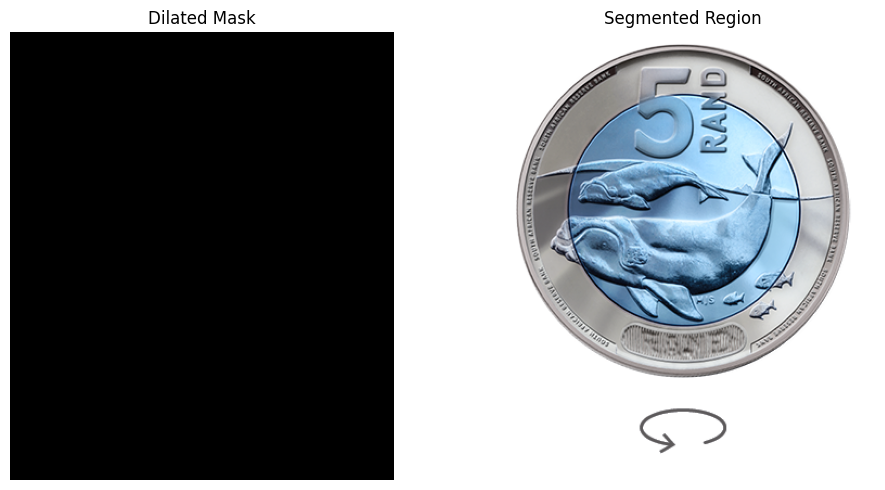

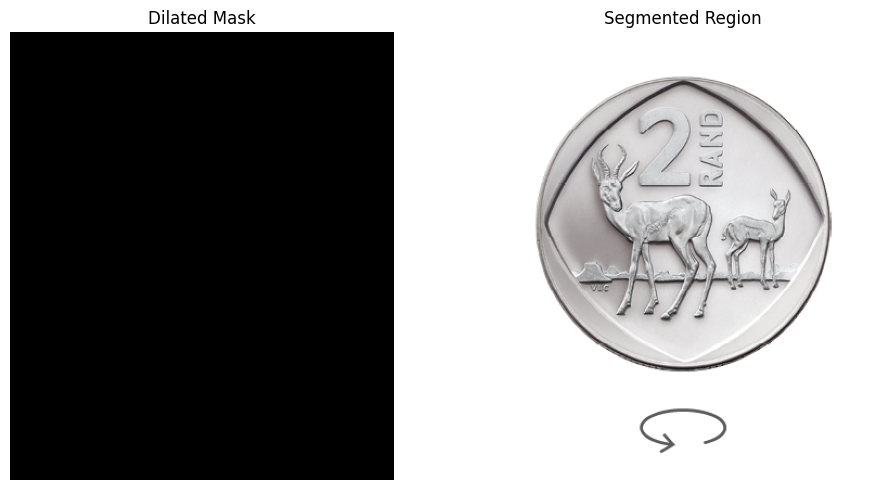

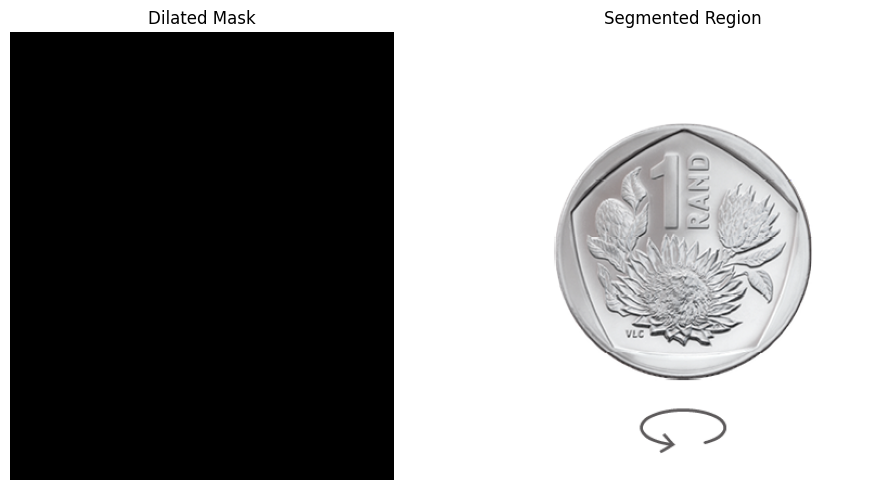

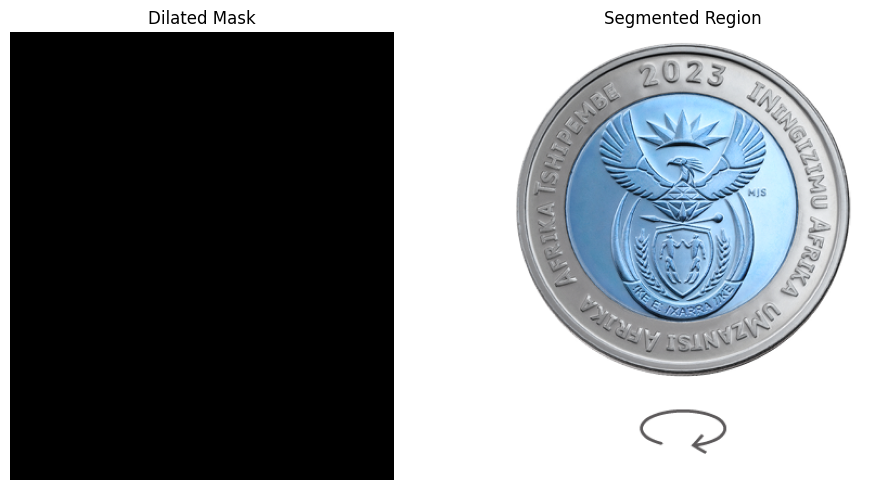

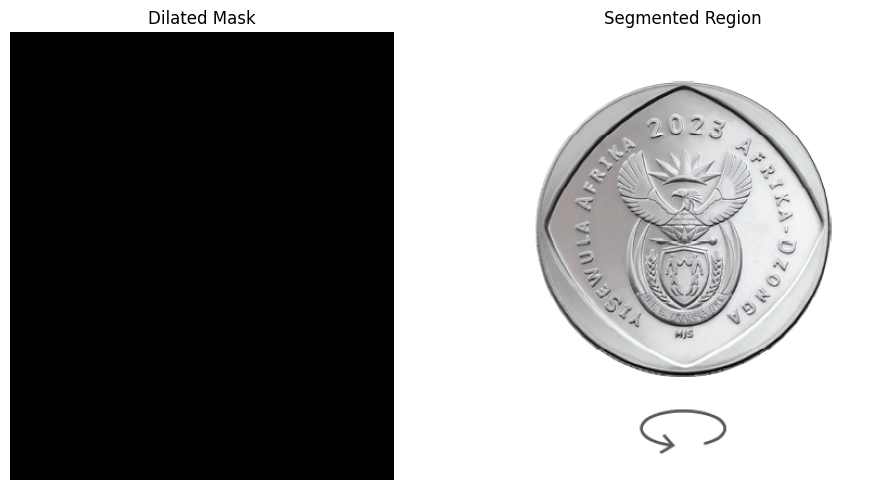

...

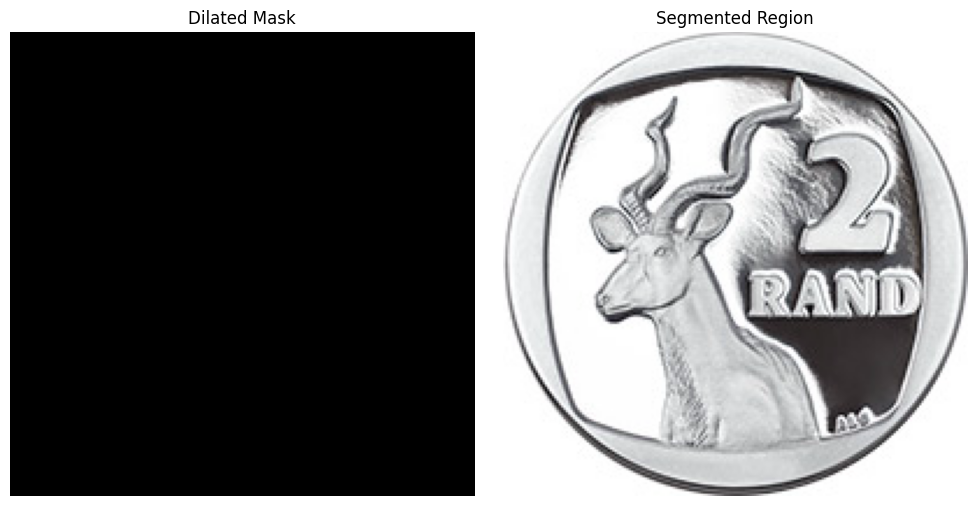

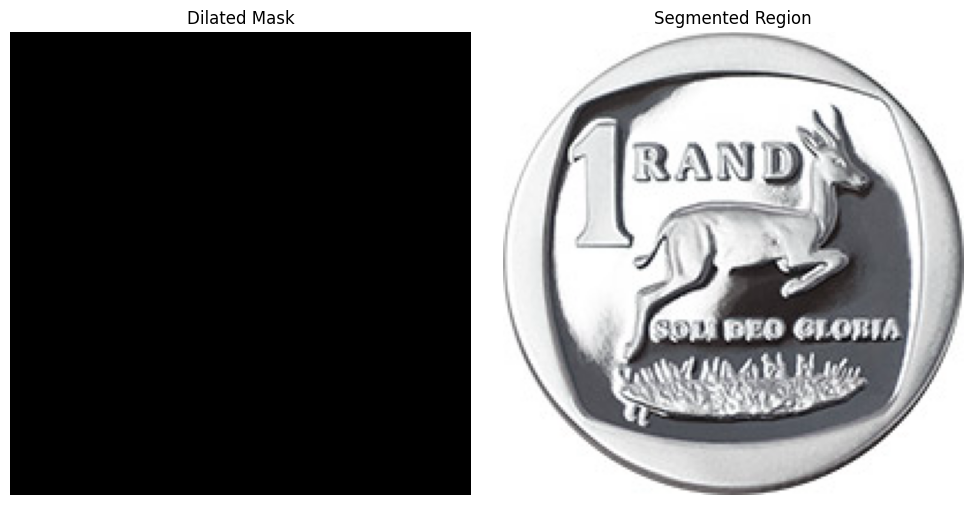

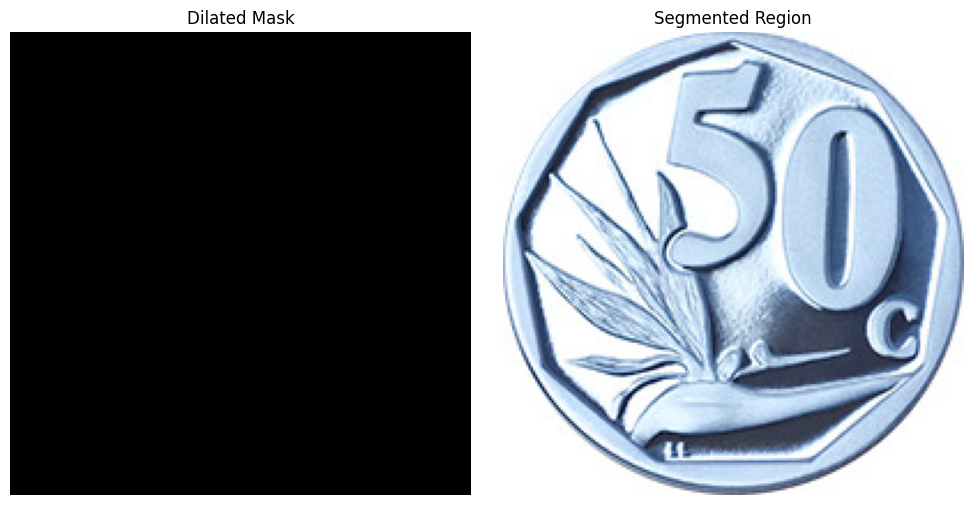

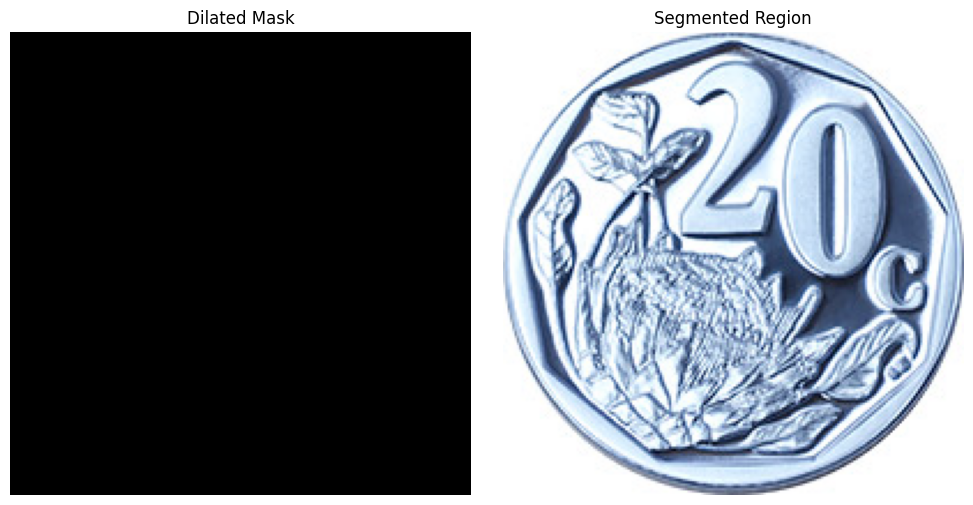

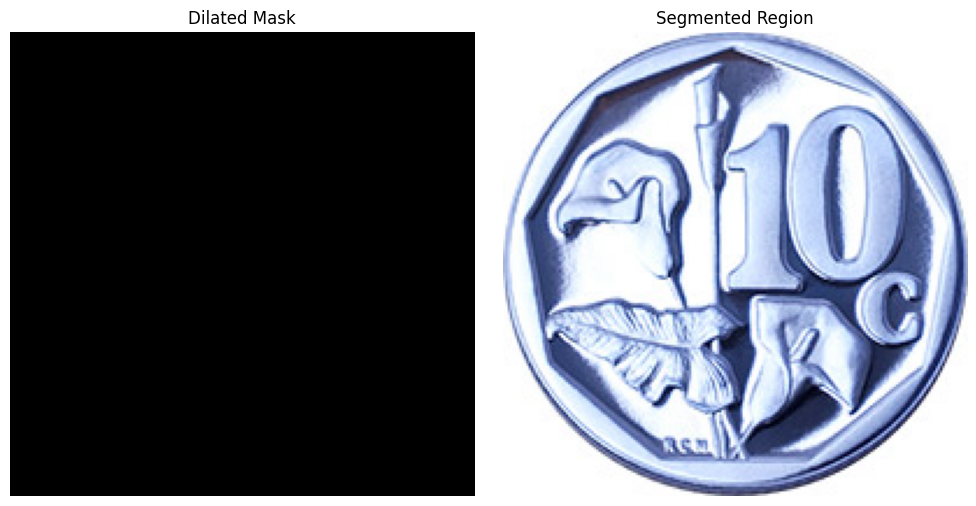

In [148]:
# Apply adaptive Gaussian thresholding
def adaptive_gaussian_thresholding(image):
  block_size = 25
  constant = 9
  _, _, _, _, combined = combined_gradient(image)
  binary_image = cv2.adaptiveThreshold(combined, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, block_size, constant)

  # Apply morphological operations to remove noise and enhance regions
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

  # Perform distance transform to obtain markers for watershed
  dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 3)
  _, markers = cv2.threshold(dist_transform, 0.1 * dist_transform.max(), 255, 0)
  markers = cv2.connectedComponents(markers.astype(np.uint8))[1]

  # Convert the grayscale image to 3-channel color image
  image_color = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)

  # Apply watershed algorithm for segmentation
  segmented_image = cv2.watershed(image_color, markers)
  segmented_image[segmented_image == -1] = 0

  # Create a mask based on the segmented image
  segmented_mask = np.where(segmented_image != 0, 255, 0).astype(np.uint8)

  # Dilate the segmented mask to include more pixels in the extraction
  kernel = np.ones((5, 5), np.uint8)
  dilated_mask = cv2.dilate(segmented_mask, kernel, iterations=3)

  # Apply the dilated mask to the original image
  segmented_region = cv2.bitwise_and(image, image, mask=dilated_mask)

  return segmented_region , dilated_mask
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply adaptive_gaussian_thresholding function
        segmented_region, dilated_mask = adaptive_gaussian_thresholding(image)

        # Create a figure to display the results
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        # Display the dilated mask
        axs[0].imshow(dilated_mask, cmap='gray')
        axs[0].set_title('Dilated Mask')
        axs[0].axis('off')

        # Display the segmented region
        axs[1].imshow(segmented_region)
        axs[1].set_title('Segmented Region')
        axs[1].axis('off')

        plt.tight_layout()
        plt.show()


<ipython-input-150-22faa97a9493>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab20', np.max(labels) + 1)


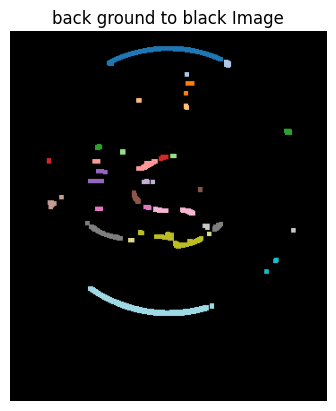

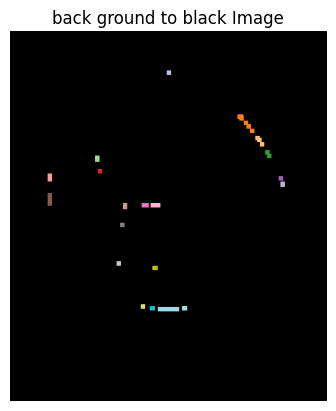

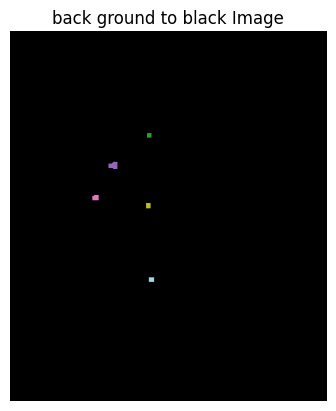

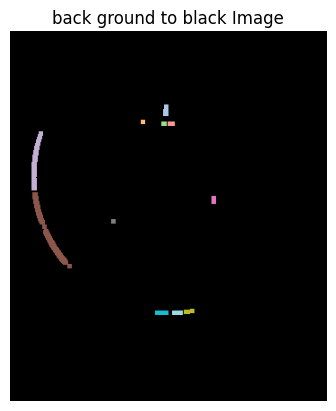

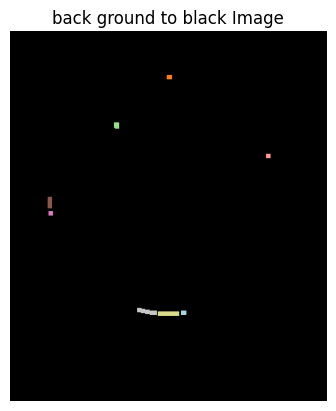

...

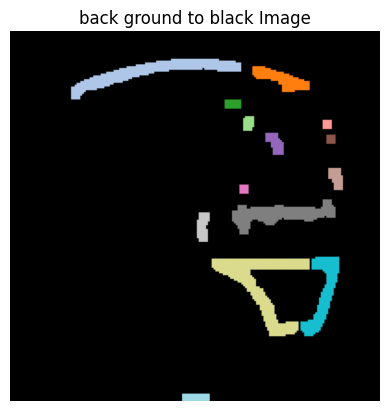

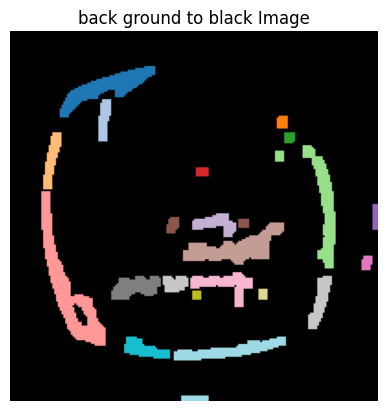

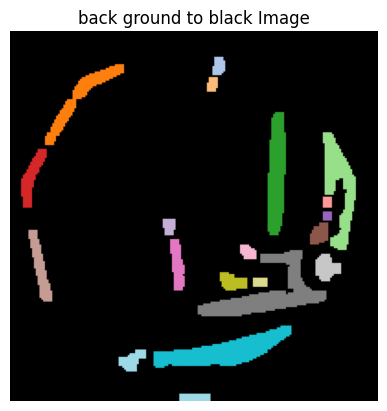

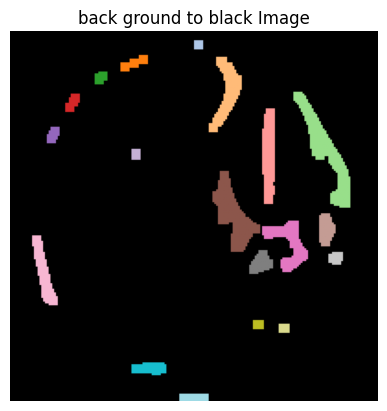

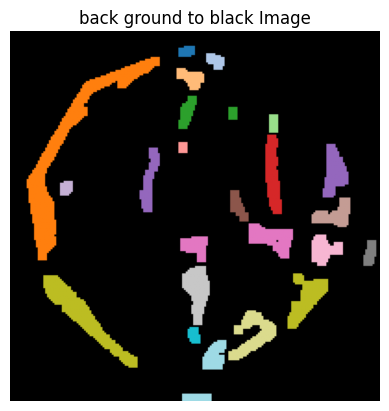

In [150]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image

# Convert to grayscale
#background to black
def background_to_black(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Apply adaptive Gaussian thresholding
  block_size = 25
  constant = 9
  binary_image = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, block_size, constant)

  # Apply morphological operations to remove noise and enhance regions
  kernel = np.ones((3, 3), np.uint8)
  opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel, iterations=2)

  # Perform connected component analysis to label regions
  _, labels = cv2.connectedComponents(opening)

  # Create a colormap for visualization
  colormap = plt.cm.get_cmap('tab20', np.max(labels) + 1)

  # Create a colored segmented image
  segmented_image = colormap(labels)

  # Set the background to black
  segmented_image[opening == 0] = [0, 0, 0, 1]
  return segmented_image

for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply background_to_black function
        segmented_image = background_to_black(image)

        # Display the segmented image
        plt.imshow(segmented_image)
        plt.title('back ground to black Image')
        plt.axis('off')
        plt.show()

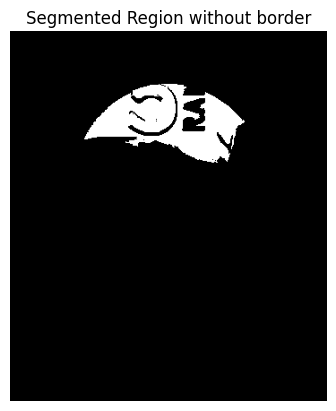

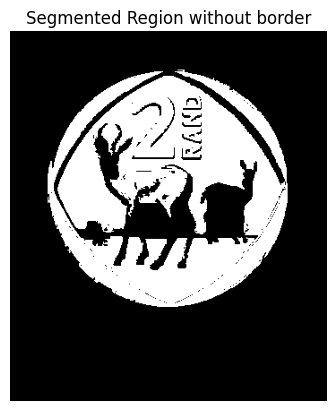

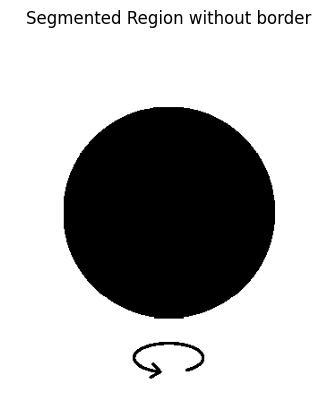

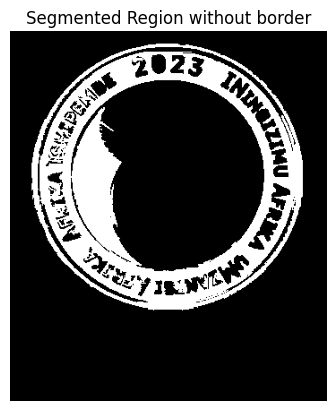

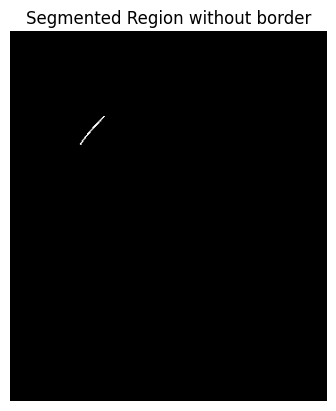

...

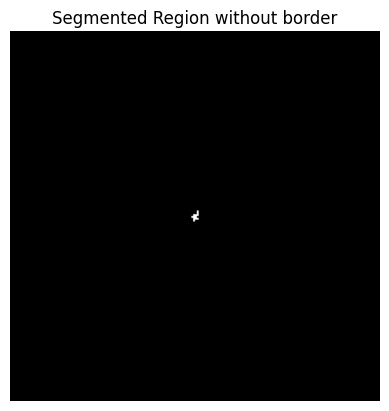

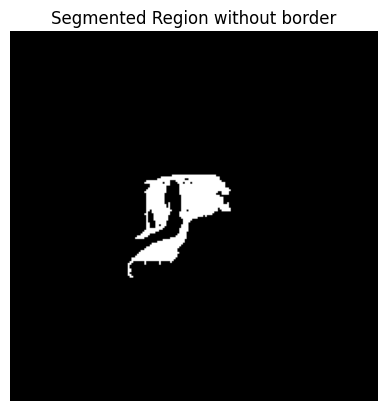

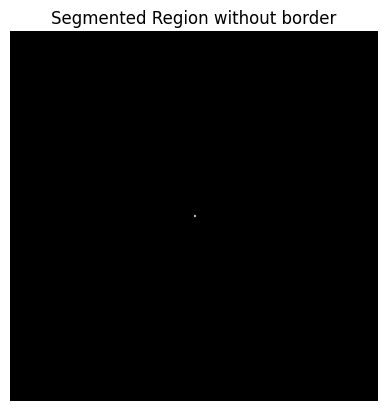

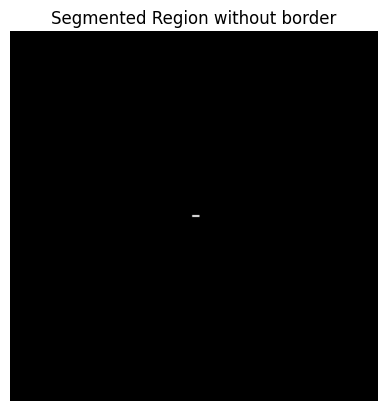

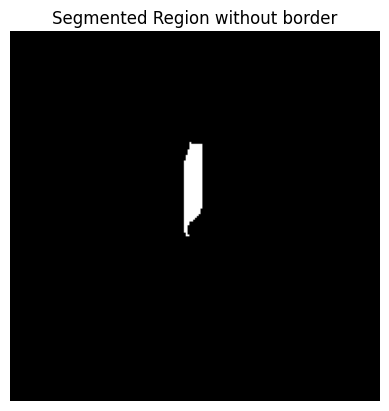

In [153]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def region_without_borders(image):
  # Convert to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Create a mask to store the segmented region with a border
  mask = np.zeros((gray.shape[0] + 2, gray.shape[1] + 2), dtype=np.uint8)

  # Define seed point for region growing
  seed_point = (100, 100)

  # Set the seed point as the initial region
  cv2.floodFill(gray, mask, seed_point, 255, loDiff=10, upDiff=10)

  # Extract the region without the border
  segmented_region = mask[1:-1, 1:-1]

  return segmented_region
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply region_without_borders function
        segmented_region = region_without_borders(image)

        # Display the segmented region
        plt.imshow(segmented_region, cmap='gray')
        plt.title('Segmented Region without border')
        plt.axis('off')
        plt.show()


<ipython-input-154-4c49b76b8fbc>:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab20', np.max(labels) + 1)


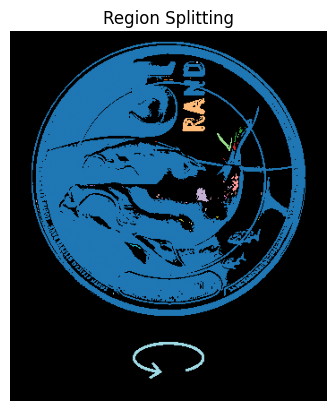

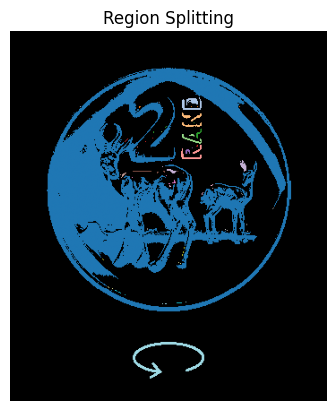

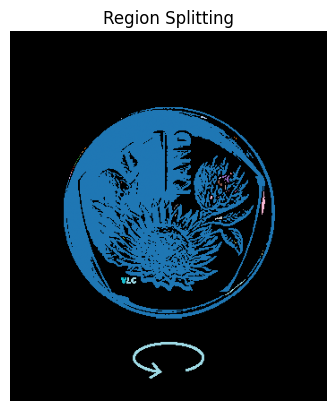

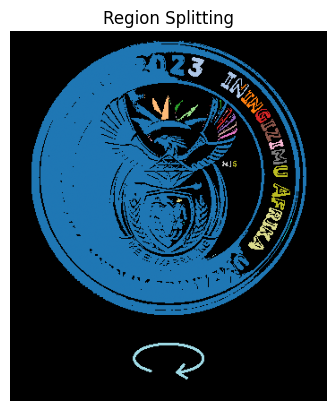

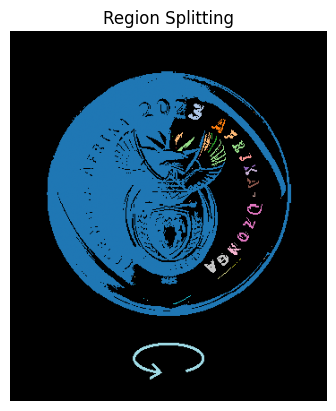

...

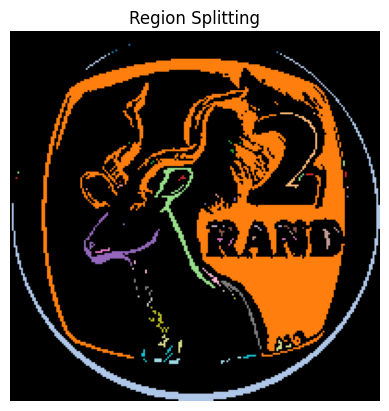

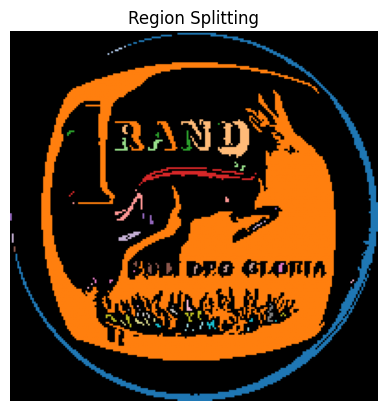

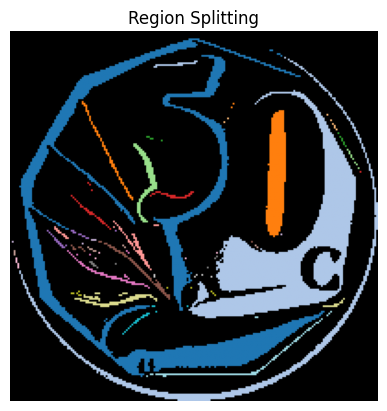

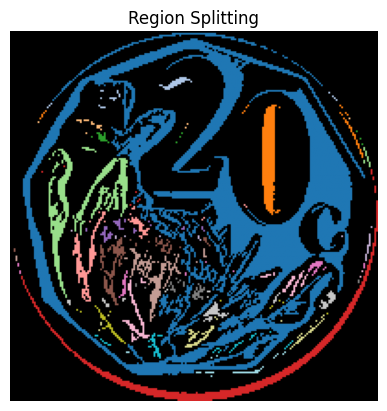

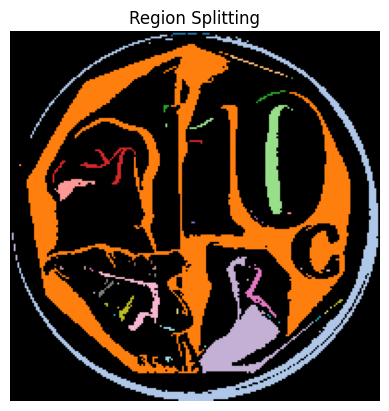

In [154]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert to grayscale
def region_splitting(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Apply adaptive thresholding
  _, binary_image = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

  # Perform connected component analysis to label regions
  _, labels = cv2.connectedComponents(binary_image)

  # Create a colormap for visualization
  colormap = plt.cm.get_cmap('tab20', np.max(labels) + 1)

  # Create a colored segmented image
  segmented_image = colormap(labels)

  # Set the background to black
  segmented_image[binary_image == 0] = [0, 0, 0, 1]
  return segmented_image

for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply region_splitting function
        segmented_image = region_splitting(image)

        # Display the segmented image
        plt.imshow(segmented_image)
        plt.title('Region Splitting')
        plt.axis('off')
        plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


def region_splitting_and_merging(image):
  # Convert to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Apply adaptive Gaussian thresholding
  block_size = 25
  constant = 9
  binary_image = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY_INV, block_size, constant)

  # Perform region splitting and merging
  def split_and_merge(region):
      stack = [region]

      while stack:
          x, y, w, h = stack.pop()

          # Calculate the mean intensity of the region
          mean_intensity = np.mean(gray[y:h, x:w])

          # Check if the region needs to be split
          if w - x > 5 and h - y > 5 and mean_intensity > 100:
              # Split the region into four quadrants
              half_width, half_height = (w - x) // 2, (h - y) // 2

              # Define the four quadrants
              top_left = (x, y, x + half_width, y + half_height)
              top_right = (x + half_width, y, w, y + half_height)
              bottom_left = (x, y + half_height, x + half_width, h)
              bottom_right = (x + half_width, y + half_height, w, h)

              # Push the quadrants to the stack
              stack.extend([top_left, top_right, bottom_left, bottom_right])
          else:
              # Merge the region by setting its pixels to white
              binary_image[y:h, x:w] = 255


  # Start the region splitting and merging process
  image_height, image_width = gray.shape
  initial_region = (0, 0, image_width, image_height)
  split_and_merge(initial_region)
  return binary_image

for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply region_splitting_and_merging function
        segmented_image = region_splitting_and_merging(image)

        # Display the segmented image
        plt.imshow(segmented_image, cmap='gray')
        plt.title('Segmented Image')
        plt.axis('off')
        plt.show()

In [ ]:
import cv2
def keypoints(image):
# Convert the image to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Initialize the SIFT feature detector
  sift = cv2.SIFT_create()

  # Detect keypoints and compute descriptors
  keypoints, descriptors = sift.detectAndCompute(gray, None)

  # Draw the keypoints on the image
  image_with_keypoints = cv2.drawKeypoints(image, keypoints, None)
  return image_with_keypoints
for filename in os.listdir(image_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Read the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)

        # Apply the keypoints function
        image_with_keypoints = keypoints(image)

        # Display the image with keypoints
        plt.imshow(image_with_keypoints)
        plt.title('Keypoints')
        plt.axis('off')
        plt.show()



Image with Contours
Area: 417.5
Perimeter: 360.7766921520233
Centroid: (174, 363)
----------------------


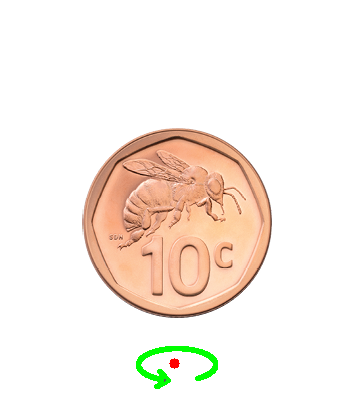

In [163]:
import cv2
import numpy as np

# Load the image
image_path = '/content/drive/MyDrive/Coins/Coins/10c_O 1.png'
image = cv2.imread(image_path)
def image_contours(image):
  # Convert the image to grayscale
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  # Threshold the image
  _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

  # Find contours in the binary image
  contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Compute shape descriptors for each contour
  for contour in contours:
      # Compute area
      area = cv2.contourArea(contour)

      # Compute perimeter
      perimeter = cv2.arcLength(contour, True)

      # Compute centroid if the contour has non-zero area
      if area > 0:
          moments = cv2.moments(contour)
          centroid_x = int(moments['m10'] / moments['m00'])
          centroid_y = int(moments['m01'] / moments['m00'])
          centroid = (centroid_x, centroid_y)
      else:
          # Set centroid to (-1, -1) if the contour has zero area
          centroid = (-1, -1)

      # Draw contour and centroid on the image
      cv2.drawContours(image, [contour], 0, (0, 255, 0), 2)
      cv2.circle(image, centroid, 5, (0, 0, 255), -1)

      # Print shape descriptors
      print('Area:', area)
      print('Perimeter:', perimeter)
      print('Centroid:', centroid)
      print('----------------------')
      return image

# Display the image with contours and centroids
print('Image with Contours')
cv2_imshow(image_contours(image))
cv2.waitKey(0)
cv2.destroyAllWindows()


In [165]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
import os

# Folder path containing the images
folder_path = image_dir

# Get a list of all files in the folder
file_list = os.listdir(folder_path)

# Loop over each file in the folder
for file_name in file_list:
    # Check if the file is an image (you can add more file extensions if needed)
    if file_name.endswith('.jpg') or file_name.endswith('.png'):
        # Construct the full file path
        file_path = os.path.join(folder_path, file_name)

        # Load the image
        image = cv2.imread(file_path)

        # Convert the image to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Perform Felzenszwalb's algorithm for graph-based segmentation
        segments_felzenszwalb = felzenszwalb(image_rgb, scale=100, sigma=0.5, min_size=50)

        # Create a mask for the Felzenszwalb segments
        mask = np.zeros_like(image_rgb)

        for segment_id in np.unique(segments_felzenszwalb):
            mask[segments_felzenszwalb == segment_id] = image_rgb[segments_felzenszwalb == segment_id]

        # Save the Felzenszwalb segmentation image
        output_path = os.path.join(folder_path, f'Felzenszwalb_Segmentation_{file_name}')
        cv2.imwrite(output_path, mask)

        print(f'Felzenszwalb Segmentation image saved successfully for {file_name}.')


Felzenszwalb Segmentation image saved successfully for R5_O1.png.
Felzenszwalb Segmentation image saved successfully for R2_O1.png.
Felzenszwalb Segmentation image saved successfully for R1_O 1.png.
Felzenszwalb Segmentation image saved successfully for R5_RA.png.
Felzenszwalb Segmentation image saved successfully for R2_R1.png.
Felzenszwalb Segmentation image saved successfully for R1_R1.png.
Felzenszwalb Segmentation image saved successfully for 50c_O1.png.
Felzenszwalb Segmentation image saved successfully for 50c_R1.png.
Felzenszwalb Segmentation image saved successfully for 20c_O 1.png.
Felzenszwalb Segmentation image saved successfully for 20c_R1.png.
Felzenszwalb Segmentation image saved successfully for 10c_O 1.png.
Felzenszwalb Segmentation image saved successfully for 10c_R1.png.
Felzenszwalb Segmentation image saved successfully for R5.jpg.
Felzenszwalb Segmentation image saved successfully for R2.jpg.
Felzenszwalb Segmentation image saved successfully for R1.jpg.
Felzenszwa